In [148]:
#Подготовка, выгружаем все нужные библиотеки, а также загружаем датафреймы
import numpy as np
import pandas as pd
import random

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

from sklearn.model_selection import cross_val_score
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import KFold, GridSearchCV

In [149]:
import warnings
warnings.filterwarnings('ignore')
sns.set(style='whitegrid')
sns.set_context("paper", font_scale=1.5)  
pd.options.display.float_format = '{:,.2f}'.format
pd.set_option('display.max_rows', 50)

In [150]:
train = pd.read_csv('train.csv', index_col='Id')
train.head(10)

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
Id,,,,,,,,,,,,,,,,,,,
14038,35,2.00,47.98,29.44,6.00,7,9.00,1969,0.09,B,B,33,7976,5,nan,0,11,B,"184,966.93"
15053,41,3.00,65.68,40.05,8.00,7,9.00,1978,0.00,B,B,46,10309,1,240.00,1,16,B,"300,009.45"
4765,53,2.00,44.95,29.20,0.00,8,12.00,1968,0.05,B,B,34,7759,0,229.00,1,3,B,"220,925.91"
5809,58,2.00,53.35,52.73,9.00,8,17.00,1977,0.44,B,B,23,5735,3,"1,084.00",0,5,B,"175,616.23"
10783,99,1.00,39.65,23.78,7.00,11,12.00,1976,0.01,B,B,35,5776,1,"2,078.00",2,4,B,"150,226.53"
12915,59,3.00,80.38,46.68,12.00,5,17.00,2011,0.31,B,B,35,7715,4,990.00,0,6,B,"215,898.45"
14549,154,2.00,62.25,37.16,7.00,3,5.00,1960,0.46,B,B,20,4386,14,nan,1,5,B,"296,021.20"
11993,74,2.00,80.31,nan,0.00,14,0.00,1977,0.08,B,B,6,1437,3,nan,0,2,B,"221,244.16"
5172,1,2.00,64.51,nan,1.00,9,17.00,1977,0.01,B,B,1,264,0,nan,0,1,B,"229,102.80"


In [151]:
test = pd.read_csv('test.csv', index_col='Id')
test.head(10)

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2
Id,,,,,,,,,,,,,,,,,,
725,58,2.00,49.88,33.43,6.00,6,14.00,1972,0.31,B,B,11,2748,1,nan,0,0,B
15856,74,2.00,69.26,nan,1.00,6,1.00,1977,0.08,B,B,6,1437,3,nan,0,2,B
5480,190,1.00,13.60,15.95,12.00,2,5.00,1909,0.00,B,B,30,7538,87,"4,702.00",5,5,B
15664,47,2.00,73.05,51.94,9.00,22,22.00,2007,0.10,B,B,23,4583,3,nan,3,3,B
14275,27,1.00,47.53,43.39,1.00,17,17.00,2017,0.07,B,B,2,629,1,nan,0,0,A
7633,53,1.00,40.68,nan,1.00,21,21.00,1977,0.05,B,B,34,7759,0,229.00,1,3,B
13329,23,2.00,68.10,64.84,1.00,2,17.00,1977,0.08,B,B,6,1437,3,nan,0,2,B
5502,32,2.00,48.19,32.86,6.00,5,14.00,1972,0.14,B,B,46,7960,6,350.00,3,11,B
4220,96,3.00,72.28,45.97,9.00,17,17.00,1997,0.04,B,B,53,14892,4,nan,1,4,B


In [152]:
#Смотри о них информацию
train.shape, test.shape

((10000, 19), (5000, 18))

In [153]:
train.dtypes

DistrictId         int64
Rooms            float64
Square           float64
LifeSquare       float64
KitchenSquare    float64
Floor              int64
HouseFloor       float64
HouseYear          int64
Ecology_1        float64
Ecology_2         object
Ecology_3         object
Social_1           int64
Social_2           int64
Social_3           int64
Healthcare_1     float64
Helthcare_2        int64
Shops_1            int64
Shops_2           object
Price            float64
dtype: object

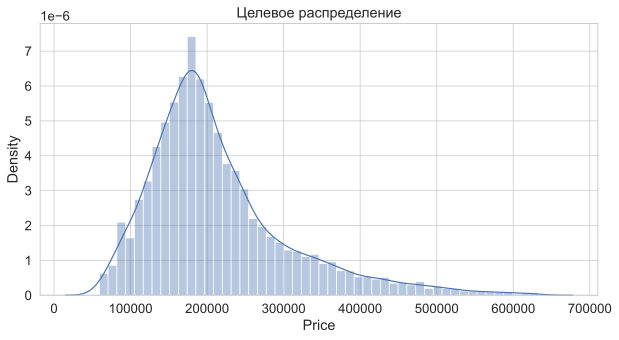

In [154]:
#Начинаем работу с данными

plt.figure(figsize = (10, 5))

sns.distplot(train['Price'])
plt.title('Целевое распределение');

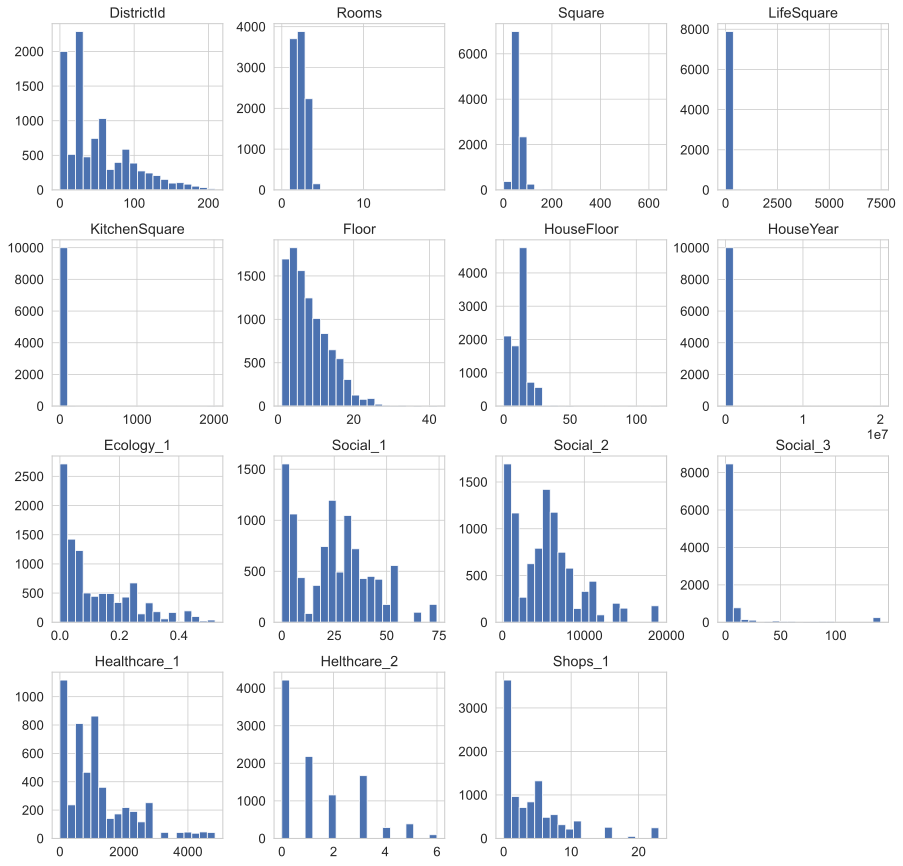

In [155]:
feature_names = train.drop('Price', axis=1).select_dtypes(include=['float64','int64']).\
    columns.tolist()
train[feature_names].hist(figsize=(15,15), bins=20, grid=True);

In [156]:
#Номинативные переменные (Ecology_2, Ecology_3, Shops_2)

train['Shops_2'].value_counts()

B    9175
A     825
Name: Shops_2, dtype: int64

In [157]:
train['Ecology_2'].value_counts()

B    9903
A      97
Name: Ecology_2, dtype: int64

In [158]:
train['Ecology_3'].value_counts()

B    9725
A     275
Name: Ecology_3, dtype: int64

In [159]:
#Так как все они принимают всего 2 значения, заменим их

feature_bin_names = ['Ecology_2', 'Ecology_3', 'Shops_2']

train[feature_bin_names] = train[feature_bin_names].astype(str)
test[feature_bin_names] = test[feature_bin_names].astype(str)

In [160]:
train[feature_bin_names] = train[feature_bin_names].replace({'A':0, 'B':1})
test[feature_bin_names] = test[feature_bin_names].replace({'A':0, 'B':1})

In [161]:
train[feature_bin_names] = train[feature_bin_names].astype(int)
test[feature_bin_names] = test[feature_bin_names].astype(int)

train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 14038 to 6306
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   DistrictId     10000 non-null  int64  
 1   Rooms          10000 non-null  float64
 2   Square         10000 non-null  float64
 3   LifeSquare     7887 non-null   float64
 4   KitchenSquare  10000 non-null  float64
 5   Floor          10000 non-null  int64  
 6   HouseFloor     10000 non-null  float64
 7   HouseYear      10000 non-null  int64  
 8   Ecology_1      10000 non-null  float64
 9   Ecology_2      10000 non-null  int64  
 10  Ecology_3      10000 non-null  int64  
 11  Social_1       10000 non-null  int64  
 12  Social_2       10000 non-null  int64  
 13  Social_3       10000 non-null  int64  
 14  Healthcare_1   5202 non-null   float64
 15  Helthcare_2    10000 non-null  int64  
 16  Shops_1        10000 non-null  int64  
 17  Shops_2        10000 non-null  int64  
 18  Pri

In [162]:
#Смотрим пропуски
train.isnull().sum()

DistrictId          0
Rooms               0
Square              0
LifeSquare       2113
KitchenSquare       0
Floor               0
HouseFloor          0
HouseYear           0
Ecology_1           0
Ecology_2           0
Ecology_3           0
Social_1            0
Social_2            0
Social_3            0
Healthcare_1     4798
Helthcare_2         0
Shops_1             0
Shops_2             0
Price               0
dtype: int64

In [163]:
#Самый пррсто способ избавиться от пропусков, это изменить пропуски на значение медианы, так и поступим с Healthcare_1
train['Healthcare_1'].fillna(train['Healthcare_1'].median(), inplace=True)
test['Healthcare_1'].fillna(train['Healthcare_1'].median(), inplace=True)

In [164]:
train.isnull().sum()

DistrictId          0
Rooms               0
Square              0
LifeSquare       2113
KitchenSquare       0
Floor               0
HouseFloor          0
HouseYear           0
Ecology_1           0
Ecology_2           0
Ecology_3           0
Social_1            0
Social_2            0
Social_3            0
Healthcare_1        0
Helthcare_2         0
Shops_1             0
Shops_2             0
Price               0
dtype: int64

In [165]:
#Разберемся с LifeSquare. Исходя из логических соображений LifeSquare = Square - KitchenSquare
train.loc[train['LifeSquare'].isna(), 'LifeSquare'] = train['Square'] - train['KitchenSquare']
test.loc[test['LifeSquare'].isna(), 'LifeSquare'] = test['Square'] - test['KitchenSquare']

In [166]:
train.isnull().sum()

DistrictId       0
Rooms            0
Square           0
LifeSquare       0
KitchenSquare    0
Floor            0
HouseFloor       0
HouseYear        0
Ecology_1        0
Ecology_2        0
Ecology_3        0
Social_1         0
Social_2         0
Social_3         0
Healthcare_1     0
Helthcare_2      0
Shops_1          0
Shops_2          0
Price            0
dtype: int64

In [167]:
#От пропусков избавились, теперь перейдем к выборсам.
#Обработка выбросов
train['Rooms'].value_counts()

2.00     3880
1.00     3705
3.00     2235
4.00      150
5.00       18
0.00        8
10.00       2
19.00       1
6.00        1
Name: Rooms, dtype: int64

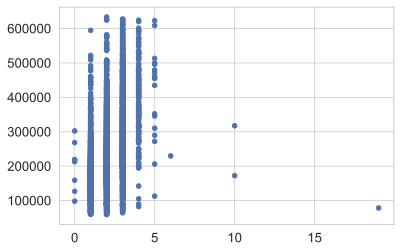

In [168]:
#Есть явно выбивающиеся значения из общей выборки, посмотри их ссотношение с ценой
plt.scatter(train['Rooms'], train['Price']);

In [169]:
#Видим, что значения цены на квартиры с > 5 комнат слишком выбиваеться из выборки, 
#это может повлиять на корректность предсказаний, а так же кавртиры не могут быть с нулевым количеством кавртир
test['Rooms'].value_counts()

2.00     2030
1.00     1769
3.00     1099
4.00       90
5.00        7
0.00        2
6.00        2
17.00       1
Name: Rooms, dtype: int64

In [170]:
#С тестовыми значениями не все так плохо, но все равно есть выбросы, заменим все странные значения на моду
train['Rooms'].mode()[0] # = 2.0

train.loc[(train['Rooms'] > 5) | (train['Rooms'] == 0), 'Rooms'] = train['Rooms'].mode()[0]
test.loc[(test['Rooms'] > 5) | (test['Rooms'] == 0), 'Rooms'] = train['Rooms'].mode()[0]

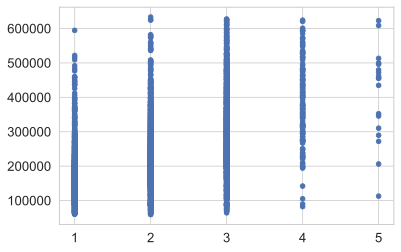

In [171]:
plt.scatter(train['Rooms'], train['Price']);

In [172]:
#Разберемся с квадратами
#Kitchen Square

sns.jointplot(train['KitchenSquare'], train['Square'], kind='scatter', height=8);

In [173]:
#Видим на графике странные соотношения, выведем их
train.loc[(train['KitchenSquare'] > train['Square']), :]

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
Id,,,,,,,,,,,,,,,,,,,
14656,62,1.00,47.10,46.45,"2,014.00",4,1.00,2014,0.07,1,1,2,629,1,900.00,0,0,0,"108,337.48"
13703,42,1.00,38.07,19.72,73.00,9,10.00,2006,0.16,1,1,21,5731,0,900.00,1,0,1,"160,488.03"
6569,27,1.00,38.22,18.72,84.00,4,17.00,2018,0.01,1,1,4,915,0,900.00,0,0,1,"99,079.96"
14679,81,1.00,32.28,19.28,"1,970.00",6,1.00,1977,0.01,1,1,30,5285,0,645.00,6,6,1,"105,539.56"


In [174]:
#По логике KitchenSquare = Square - Lifesquare
train.loc[(train['KitchenSquare'] > train['Square']), 'KitchenSquare'] = train['Square'] - train['LifeSquare']

In [175]:
test.loc[(test['KitchenSquare'] > test['Square']), :]

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2
Id,,,,,,,,,,,,,,,,,,
14594,11,2.00,42.80,24.22,620.00,11,14.00,1972,0.04,1,1,28,6533,1,"1,015.00",2,5,1
10662,29,1.00,25.96,17.25,33.00,5,5.00,1973,0.07,1,1,31,6119,4,900.00,1,2,1
3194,29,2.00,43.93,31.03,44.00,6,5.00,1964,0.09,1,1,10,2277,2,"1,547.00",0,0,1
12640,6,2.00,54.63,31.49,97.00,4,17.00,2015,0.24,1,1,5,1564,0,540.00,0,0,1


In [176]:
test.loc[(test['KitchenSquare'] > test['Square']), 'KitchenSquare'] = test['Square'] - test['LifeSquare']

In [177]:
#LifeSquare
sns.jointplot(train['LifeSquare'], train['Price'], kind='scatter', height=8);

In [178]:
#Также видим значения выбивающиеся из общей выборки
train.loc[(train['LifeSquare'] > train['Square']), :]

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
Id,,,,,,,,,,,,,,,,,,,
8054,23,1.00,42.53,43.97,1.00,3,9.00,2014,0.03,1,1,0,168,0,900.00,0,0,1,"95,338.20"
10521,38,3.00,104.21,106.34,0.00,20,0.00,2017,0.06,1,1,15,2787,2,520.00,0,7,1,"435,462.05"
2301,1,2.00,61.40,65.22,0.00,17,22.00,2016,0.01,1,1,1,264,0,900.00,0,1,1,"199,215.45"
8753,25,3.00,85.95,89.80,1.00,4,3.00,2017,0.07,1,1,53,13670,4,900.00,1,11,1,"309,688.59"
9870,62,1.00,51.83,53.49,1.00,5,1.00,2015,0.07,1,1,2,629,1,900.00,0,0,0,"131,797.47"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41,30,2.00,59.02,59.44,12.00,5,5.00,2016,0.00,1,1,22,6398,141,"1,046.00",3,23,1,"126,281.14"
12918,23,2.00,51.44,53.13,51.00,3,17.00,2017,0.01,1,1,1,388,0,900.00,0,0,1,"88,150.01"
2737,27,3.00,123.43,125.81,123.00,5,10.00,2015,0.02,1,1,2,469,0,900.00,0,0,1,"234,194.84"


In [179]:
#Логично предположить, что LifeSquare = Square - KitchenSquare
train.loc[(train['LifeSquare'] > train['Square']), 'LifeSquare'] = train['Square'] - train['KitchenSquare']

In [180]:
test.loc[(test['LifeSquare'] > test['Square']), :]

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2
Id,,,,,,,,,,,,,,,,,,
5480,190,1.00,13.60,15.95,12.00,2,5.00,1909,0.00,1,1,30,7538,87,"4,702.00",5,5,1
11160,58,1.00,48.61,48.75,1.00,4,3.00,1977,0.44,1,1,23,5735,3,"1,084.00",0,5,1
6624,27,1.00,42.41,42.43,10.00,12,17.00,2017,0.01,1,1,4,915,0,900.00,0,0,1
11513,1,1.00,37.48,40.59,0.00,4,17.00,1977,0.01,1,1,1,264,0,900.00,0,1,1
1872,30,2.00,52.45,52.80,1.00,17,17.00,2016,0.00,1,1,22,6398,141,"1,046.00",3,23,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14686,1,3.00,77.23,79.96,1.00,18,17.00,1977,0.01,1,1,1,264,0,900.00,0,1,1
3711,94,1.00,41.28,42.39,10.00,13,13.00,2014,0.28,1,1,33,8667,2,900.00,0,6,1
5820,94,1.00,33.68,34.20,1.00,10,9.00,1972,0.13,1,1,43,8429,3,900.00,3,9,1


In [181]:
test.loc[(test['LifeSquare'] > test['Square']), 'LifeSquare'] = test['Square'] - test['KitchenSquare']

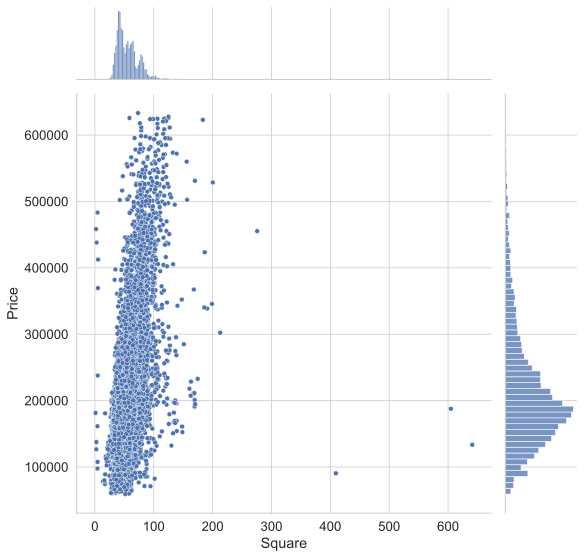

In [182]:
sns.jointplot(train['Square'], train['Price'], kind='scatter', height=8);

In [183]:
train.loc[(train['Square'] < 10) | (train['Square'] < train['LifeSquare'])
             | (train['Square'] < train['KitchenSquare']), :]

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
Id,,,,,,,,,,,,,,,,,,,
1748,88,2.00,5.50,4.50,1.00,24,22.00,1977,0.13,1,1,43,8429,3,900.00,3,9,1,"412,511.09"
11526,27,1.00,4.63,1.97,1.00,18,1.00,1977,0.01,1,1,4,915,0,900.00,0,0,1,"107,604.27"
10202,6,1.00,2.60,1.60,1.00,3,25.00,2014,0.24,1,1,5,1564,0,540.00,0,0,1,"137,597.60"
10527,27,1.00,4.38,3.38,1.00,10,17.00,2013,0.21,1,1,9,1892,0,900.00,0,1,1,"97,560.72"
9487,5,1.00,5.13,4.13,1.00,1,1.00,1977,0.15,1,1,16,3433,4,"2,643.00",4,5,1,"369,472.40"
3224,27,2.00,2.38,0.87,0.00,1,0.00,1977,0.02,1,1,2,469,0,900.00,0,0,1,"126,596.94"
4504,27,3.00,4.39,3.39,1.00,8,19.00,2016,0.21,1,1,9,1892,0,900.00,0,1,1,"161,379.07"
14786,1,1.00,1.14,0.14,1.00,3,1.00,1977,0.01,1,1,1,264,0,900.00,0,1,1,"181,434.83"
13265,1,3.00,4.82,4.82,0.00,6,17.00,1977,0.01,1,1,1,264,0,900.00,0,1,1,"237,716.68"


In [184]:
train.loc[(train['Square'] < 10) | (train['Square'] < train['LifeSquare'])
             | (train['Square'] < train['KitchenSquare']), 'Square'] = 10

In [185]:
#После логики разберемся с выбросами
train.loc[(train['LifeSquare'] > 400), 'LifeSquare'] = train['LifeSquare'].median()
test.loc[(test['LifeSquare'] > 400), 'LifeSquare'] = train['LifeSquare'].median()

train.loc[(train['KitchenSquare'] > 150), 'KitchenSquare'] = train['KitchenSquare'].median()
test.loc[(test['KitchenSquare'] > 150), 'KitchenSquare'] = train['KitchenSquare'].median()

train.loc[(train['Square'] > 400), 'Square'] = train['Square'].median()
test.loc[(test['Square'] > 400), 'Square'] = train['Square'].median()

In [186]:
len(train[(train['Square'] < train['LifeSquare'] + train['KitchenSquare'])])

359

In [187]:
train.loc[(train['Square'] < train['LifeSquare'] + train['KitchenSquare']), 'Square'] = train['LifeSquare'] + train['KitchenSquare']
test.loc[(test['Square'] < test['LifeSquare'] + test['KitchenSquare']), 'Square'] = test['LifeSquare'] + test['KitchenSquare']

In [188]:
train[['Square', 'LifeSquare', 'KitchenSquare']].describe()

,Square,LifeSquare,KitchenSquare
count,"10,000.00","10,000.00","10,000.00"
mean,56.47,40.59,5.86
std,19.75,20.55,5.07
min,10.00,0.14,0.00
25%,41.88,25.35,1.00
50%,52.71,36.71,6.00
75%,66.07,49.49,9.00
max,409.43,399.43,123.00


In [189]:
#Разберемся с этажами
train['HouseFloor'].sort_values().unique()

array([  0.,   1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,
        11.,  12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,
        22.,  23.,  24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,
        36.,  37.,  38.,  39.,  40.,  44.,  45.,  47.,  48.,  99., 117.])

In [190]:
train['Floor'].sort_values().unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 31, 32, 33, 37, 42])

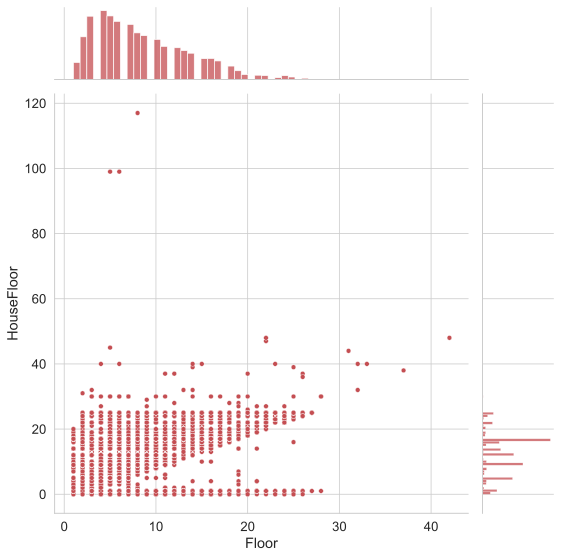

In [191]:
sns.jointplot(train['Floor'], train['HouseFloor'], kind='scatter', height=8, color='r');

In [192]:
train.loc[train['HouseFloor'] == 0, 'HouseFloor'] = train['HouseFloor'].mode()[0]
test.loc[test['HouseFloor'] == 0, 'HouseFloor'] = train['HouseFloor'].mode()[0]

In [193]:
train.loc[train['HouseFloor'] > 98, 'HouseFloor'] = train['HouseFloor'].mode()[0]
test.loc[test['HouseFloor'] > 98, 'HouseFloor'] = train['HouseFloor'].mode()[0]

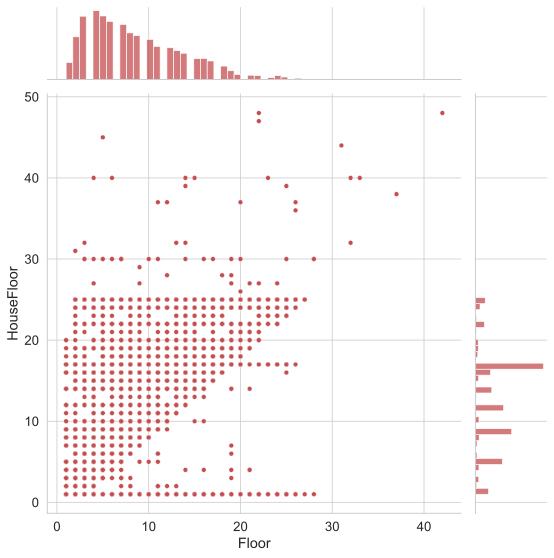

In [194]:
sns.jointplot(train['Floor'], train['HouseFloor'], kind='scatter', height=8, color='r');

In [195]:
train['HouseYear'].sort_values(ascending=False)

Id
10814    20052011
11607        4968
6731         2020
8892         2020
14318        2020
           ...   
7920         1916
6751         1914
2085         1912
14556        1912
13288        1910
Name: HouseYear, Length: 10000, dtype: int64

In [196]:
train.loc[train['HouseYear'] > 2021, 'HouseYear'] = 2021

In [197]:
#Новые признаки

train['PriceOneRoom'] = train['Price'] / train['Rooms']

In [198]:
train

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price,PriceOneRoom
Id,,,,,,,,,,,,,,,,,,,,
14038,35,2.00,47.98,29.44,6.00,7,9.00,1969,0.09,1,1,33,7976,5,900.00,0,11,1,"184,966.93","92,483.47"
15053,41,3.00,65.68,40.05,8.00,7,9.00,1978,0.00,1,1,46,10309,1,240.00,1,16,1,"300,009.45","100,003.15"
4765,53,2.00,44.95,29.20,0.00,8,12.00,1968,0.05,1,1,34,7759,0,229.00,1,3,1,"220,925.91","110,462.95"
5809,58,2.00,61.73,52.73,9.00,8,17.00,1977,0.44,1,1,23,5735,3,"1,084.00",0,5,1,"175,616.23","87,808.11"
10783,99,1.00,39.65,23.78,7.00,11,12.00,1976,0.01,1,1,35,5776,1,"2,078.00",2,4,1,"150,226.53","150,226.53"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77,32,2.00,50.40,30.48,5.00,6,5.00,1968,0.14,1,1,46,7960,6,350.00,3,11,1,"196,684.32","98,342.16"
6159,18,1.00,41.52,20.54,9.00,13,13.00,2000,0.00,1,1,30,5562,0,900.00,0,5,0,"189,050.29","189,050.29"
5123,27,1.00,47.94,46.94,1.00,12,16.00,2015,0.07,1,1,2,629,1,900.00,0,0,0,"159,143.81","159,143.81"


In [199]:
#Так как у датасета test нет Price, нужно как-то связать их по другому признаку, например по району
print(train['DistrictId'].nunique(),' = train')
print(test['DistrictId'].nunique(), ' = test')

205  = train
201  = test


In [200]:
district_size = train['DistrictId'].value_counts().reset_index().rename(columns={'index':'DistrictId', 'DistrictId':'DistrictSize'})

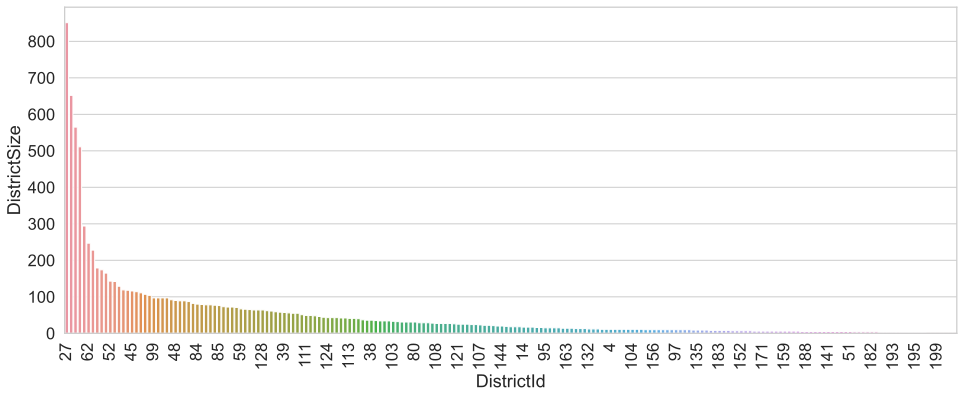

In [201]:
#Посмртрим сколько домов к какому ID отнсяться
sns.set(style="whitegrid", font_scale=1.5)
f, ax = plt.subplots(figsize=(16, 6))
sns.barplot(y='DistrictSize', x='DistrictId', 
            data=district_size,
            order=district_size.sort_values(by='DistrictSize', ascending=False)['DistrictId']
           );
ax.tick_params(axis='x', rotation=90)
ax.xaxis.set_major_locator(plt.MaxNLocator(50))

In [202]:
#Выберем самые популярные
district_size.loc[district_size['DistrictSize'] > 100, :]

,DistrictId,DistrictSize
0,27,851
1,1,652
2,23,565
3,6,511
4,9,294
5,62,247
6,30,228
7,58,179
8,53,174
9,21,165


In [203]:
#Создаем отдельюную категорию популярных ID
districts_popular = district_size.loc[district_size['DistrictSize'] > 100, 'DistrictId'].tolist()

In [204]:
district_size = district_size.groupby('DistrictId')['DistrictSize'].agg(
                            DistrictSize='median')
district_size.reset_index(level='DistrictId', inplace=True)

In [205]:
train.loc[~train['DistrictId'].isin(districts_popular), 'DistrictId'] = 999
test.loc[~test['DistrictId'].isin(districts_popular), 'DistrictId'] = 999

In [206]:
test['DistrictId'].value_counts()

999    2551
27      391
1       344
23      264
6       257
9       132
62      122
30      115
58       91
53       91
21       70
52       67
61       64
8        64
46       61
34       61
74       61
57       54
45       49
44       46
11       45
Name: DistrictId, dtype: int64

In [207]:
train = train.merge(district_size, on='DistrictId', how='left').set_index(train.index)
test = test.merge(district_size, on='DistrictId', how='left').set_index(test.index)
train.head()

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,...,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price,PriceOneRoom,DistrictSize
Id,,,,,,,,,,,,,,,,,,,,,
14038,999,2.00,47.98,29.44,6.00,7,9.00,1969,0.09,1,...,33,7976,5,900.00,0,11,1,"184,966.93","92,483.47",nan
15053,999,3.00,65.68,40.05,8.00,7,9.00,1978,0.00,1,...,46,10309,1,240.00,1,16,1,"300,009.45","100,003.15",nan
4765,53,2.00,44.95,29.20,0.00,8,12.00,1968,0.05,1,...,34,7759,0,229.00,1,3,1,"220,925.91","110,462.95",174.00
5809,58,2.00,61.73,52.73,9.00,8,17.00,1977,0.44,1,...,23,5735,3,"1,084.00",0,5,1,"175,616.23","87,808.11",179.00
10783,999,1.00,39.65,23.78,7.00,11,12.00,1976,0.01,1,...,35,5776,1,"2,078.00",2,4,1,"150,226.53","150,226.53",nan


In [208]:
price_by_district = train.groupby(['DistrictId'], as_index=False)\
                        .agg({'PriceOneRoom':'median'})\
                        .rename(columns={'PriceOneRoom':'PriceOneRoomByDistrict'})

price_by_district

,DistrictId,PriceOneRoomByDistrict
0,1,"106,080.90"
1,6,"94,232.67"
2,8,"120,139.85"
3,9,"96,749.26"
4,11,"100,098.98"
5,21,"104,448.25"
6,23,"76,232.42"
7,27,"94,738.78"
8,30,"93,960.73"
9,34,"129,738.65"


In [209]:
train = train.merge(price_by_district, on=['DistrictId'], how='left').set_index(train.index)
test = test.merge(price_by_district, on=['DistrictId'], how='left').set_index(test.index)

In [210]:
test.head()

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,DistrictSize,PriceOneRoomByDistrict
Id,,,,,,,,,,,,,,,,,,,,
725,58,2.00,49.88,33.43,6.00,6,14.00,1972,0.31,1,1,11,2748,1,900.00,0,0,1,179.00,"105,638.52"
15856,74,2.00,69.26,68.26,1.00,6,1.00,1977,0.08,1,1,6,1437,3,900.00,0,2,1,114.00,"127,646.56"
5480,999,1.00,13.60,1.60,12.00,2,5.00,1909,0.00,1,1,30,7538,87,"4,702.00",5,5,1,nan,"129,339.27"
15664,999,2.00,73.05,51.94,9.00,22,22.00,2007,0.10,1,1,23,4583,3,900.00,3,3,1,nan,"129,339.27"
14275,27,1.00,47.53,43.39,1.00,17,17.00,2017,0.07,1,1,2,629,1,900.00,0,0,0,851.00,"94,738.78"


In [211]:
train['RoomSquare'] = train['Square'] / train['Rooms']
test['RoomSquare'] = test['Square'] / test['Rooms']

In [216]:
data_train = train.copy()

In [217]:
#Разбивка данных

data_train.columns.tolist()

['DistrictId',
 'Rooms',
 'Square',
 'LifeSquare',
 'KitchenSquare',
 'Floor',
 'HouseFloor',
 'HouseYear',
 'Ecology_1',
 'Ecology_2',
 'Ecology_3',
 'Social_1',
 'Social_2',
 'Social_3',
 'Healthcare_1',
 'Helthcare_2',
 'Shops_1',
 'Shops_2',
 'Price',
 'PriceOneRoom',
 'DistrictSize',
 'PriceOneRoomByDistrict',
 'RoomSquare']

In [213]:
feature_names = ['DistrictId',
 'Rooms',
 'Square',
 'LifeSquare',
 'KitchenSquare',
 'Floor',
 'HouseFloor',
 'HouseYear',
 'Ecology_1',
 'Ecology_2',
 'Ecology_3',
 'Social_1',
 'Social_2',
 'Social_3',
 'Healthcare_1',
 'Helthcare_2',
 'Shops_1',
 'Shops_2',
 'DistrictSize',
 'PriceOneRoomByDistrict',
 'RoomSquare']

feature_names

['DistrictId',
 'Rooms',
 'Square',
 'LifeSquare',
 'KitchenSquare',
 'Floor',
 'HouseFloor',
 'HouseYear',
 'Ecology_1',
 'Ecology_2',
 'Ecology_3',
 'Social_1',
 'Social_2',
 'Social_3',
 'Healthcare_1',
 'Helthcare_2',
 'Shops_1',
 'Shops_2',
 'DistrictSize',
 'PriceOneRoomByDistrict',
 'RoomSquare']

In [218]:
target_data = data_train['Price']

In [220]:
from sklearn.preprocessing import QuantileTransformer
scaler = QuantileTransformer(n_quantiles=20, random_state=42)

data_train_for_scaling = scaler.fit_transform(data_train[feature_names].astype(float))

In [221]:
data_train_scaled = pd.DataFrame(data_train_for_scaling, columns=feature_names)

data_train_scaled.head()

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,...,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,DistrictSize,PriceOneRoomByDistrict,RoomSquare
0,1.00,0.58,0.42,0.31,0.50,0.47,0.26,0.16,0.55,1.00,...,0.68,0.80,0.76,0.50,0.00,0.91,1.00,nan,0.47,0.18
1,1.00,0.87,0.74,0.56,0.66,0.47,0.26,0.55,0.06,1.00,...,0.88,0.89,0.39,0.11,0.55,0.95,1.00,nan,0.47,0.10
2,0.42,0.58,0.34,0.30,0.00,0.53,0.39,0.14,0.38,1.00,...,0.71,0.79,0.00,0.10,0.55,0.50,1.00,0.30,0.96,0.12
3,0.45,0.58,0.67,0.79,0.76,0.53,0.74,0.42,0.97,1.00,...,0.45,0.58,0.61,0.80,0.00,0.68,1.00,0.32,0.32,0.50
4,1.00,0.00,0.17,0.22,0.58,0.71,0.39,0.29,0.21,1.00,...,0.74,0.58,0.39,0.91,0.71,0.58,1.00,nan,0.47,0.77


In [227]:
feature_names = ['Rooms', 'Square', 'LifeSquare', 'KitchenSquare',
       'Floor', 'HouseFloor', 'HouseYear', 'Ecology_1', 'Ecology_2',
       'Ecology_3', 'Social_1', 'Social_2', 'Social_3', 'Healthcare_1',
       'Helthcare_2', 'Shops_1', 'Shops_2', 'PriceOneRoomByDistrict', 'RoomSquare']

In [228]:
from sklearn.model_selection import train_test_split

In [229]:
X = data_train_scaled[feature_names]
y = target_data

In [230]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=True, random_state=45)

In [234]:
#проверка модели
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import r2_score
gbt = GradientBoostingRegressor(random_state=42, n_estimators=322).fit(X_train, y_train)

In [235]:
y_pred_train = gbt.predict(X_train)
y_pred = gbt.predict(X_test)

In [257]:
print("R^2 на тренировочной выборке: {}".format(r2_score(y_train, y_pred_train)))
print("R^2 на тестовой выборке: {}".format(r2_score(y_test, y_pred)))

#R^2 на тренировочной выборке: 0.8339023812062325
#R^2 на тестовой выборке: 0.7263732484183203

R^2 на тренировочной выборке: 0.8339023812062325


ValueError: Found input variables with inconsistent numbers of samples: [3000, 5000]

In [239]:
#Предсказание значений на тестовой выборке
data_test_prep = test.copy()

In [240]:
data_test_prep.keys()

Index(['DistrictId', 'Rooms', 'Square', 'LifeSquare', 'KitchenSquare', 'Floor',
       'HouseFloor', 'HouseYear', 'Ecology_1', 'Ecology_2', 'Ecology_3',
       'Social_1', 'Social_2', 'Social_3', 'Healthcare_1', 'Helthcare_2',
       'Shops_1', 'Shops_2', 'DistrictSize', 'PriceOneRoomByDistrict',
       'RoomSquare'],
      dtype='object')

In [241]:
feature_names = ['DistrictId', 'Rooms', 'Square', 'LifeSquare', 'KitchenSquare', 'Floor',
       'HouseFloor', 'HouseYear', 'Ecology_1', 'Ecology_2', 'Ecology_3',
       'Social_1', 'Social_2', 'Social_3', 'Healthcare_1', 'Helthcare_2',
       'Shops_1', 'Shops_2', 'DistrictSize', 'PriceOneRoomByDistrict',
       'RoomSquare']

In [243]:
data_test_for_scaling = scaler.fit_transform(data_test_prep.astype(float))

data_test_scaled = pd.DataFrame(data_test_for_scaling, columns=feature_names)

data_test_scaled.head()

,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,...,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,DistrictSize,PriceOneRoomByDistrict,RoomSquare
0,0.43,0.55,0.45,0.42,0.50,0.39,0.53,0.23,0.90,1.00,...,0.28,0.30,0.37,0.50,0.00,0.00,1.00,0.32,0.31,0.23
1,0.47,0.55,0.78,0.91,0.18,0.39,0.00,0.42,0.53,1.00,...,0.22,0.20,0.61,0.50,0.00,0.39,1.00,0.08,0.46,0.65
2,1.00,0.00,0.02,0.00,0.95,0.05,0.13,0.00,0.00,1.00,...,0.61,0.77,0.97,1.00,0.97,0.68,1.00,nan,0.71,0.03
3,1.00,0.55,0.81,0.77,0.76,0.95,0.89,0.81,0.58,1.00,...,0.45,0.41,0.61,0.50,0.84,0.50,1.00,nan,0.71,0.70
4,0.26,0.00,0.40,0.62,0.18,0.91,0.74,0.96,0.47,1.00,...,0.11,0.11,0.37,0.50,0.00,0.00,0.00,1.00,0.16,0.95


In [247]:
feature_names = ['Rooms', 'Square', 'LifeSquare', 'KitchenSquare', 'Floor',
       'HouseFloor', 'HouseYear', 'Ecology_1', 'Ecology_2', 'Ecology_3',
       'Social_1', 'Social_2', 'Social_3', 'Healthcare_1', 'Helthcare_2',
       'Shops_1', 'Shops_2', 'PriceOneRoomByDistrict',
       'RoomSquare']

In [248]:
X = data_test_scaled[feature_names]

In [249]:
y_pred = gbt.predict(X)
y_pred

array([155267.26018839, 226643.43114123, 176184.56860381, ...,
       335910.64220514, 184756.00493719, 181780.24455538])

In [254]:
a = pd.read_csv('test.csv')

In [255]:
predictions = pd.DataFrame({
    'Id': a['Id'],
    'Price':y_pred
})

In [256]:
predictions.head()

,Id,Price
0,725,"155,267.26"
1,15856,"226,643.43"
2,5480,"176,184.57"
3,15664,"359,854.00"
4,14275,"132,654.63"


In [258]:
predictions.to_csv('Bykov_Nikita_predictions.csv', index=False)